In [13]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [14]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import load_img 
from tensorflow.keras.preprocessing.image import img_to_array 
import matplotlib.pyplot as plt 

%matplotlib inline

In [15]:
# configuration parameters 
TEST_DATA_DIR = '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/'
MODEL_PATH = "./models/mobilenetv2_.h5"
TEST_SAMPLES = 430
NUM_CLASSES = 2
IMG_WIDTH, IMG_HEIGHT = 224, 224
BATCH_SIZE = 64
LABELS = ["fire", "nofire"]

### Load trained model

In [16]:
model = load_model(MODEL_PATH)

### Load test data via generator

In [17]:
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_generator = test_datagen.flow_from_directory(
    TEST_DATA_DIR,
    target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    shuffle=False,
    class_mode='categorical')

Found 430 images belonging to 2 classes.


### Show confusion matrix, classification and mis-classification reports

In [18]:
def get_misclassified_imgs(y_true: list, y_pred: list, filenames: list):
    """ return a list of wrong predictions (or, mis-classified) done by the trained model 
        :param y_true: a list of true (or ground-truth) labels 
        :param y_pred: a list of predicted labels 
        :param filenames: a list of filenames corresponding to the true labels
    """
    mismatches_imgs = list(dict())
    for i in range(0, len(y_true)):
        if y_true[i] != y_pred[i]:
            print(f"True class: {LABELS[y_true[i]]}({y_true[i]}) and predicted as: {LABELS[y_pred[i]]}({y_pred[i]})")
            temp = dict()
            temp["filename"] = filenames[i]
            temp["true label"] = y_true[i]
            temp["pred label"] = y_pred[i]
            mismatches_imgs.append(temp)
        continue
    return mismatches_imgs

In [19]:
# Plot confusion matrix, classification report and mis-classification (or, mis-matches) information for the test data
y_pred = model.predict_generator(test_generator, steps=TEST_SAMPLES // BATCH_SIZE + 1)
y_pred = np.argmax(y_pred, axis=1)
print("Confusion matrix:")
print(confusion_matrix(y_true=test_generator.classes, y_pred=y_pred))
print("-"*50)
print("Classification report:")
print(classification_report(y_true=test_generator.classes, y_pred=y_pred, target_names=LABELS))
print("Mismatches information:")
misclassified_imgs = get_misclassified_imgs(test_generator.classes, y_pred, test_generator.filepaths)

Confusion matrix:
[[207   8]
 [104 111]]
--------------------------------------------------
Classification report:
              precision    recall  f1-score   support

        fire       0.67      0.96      0.79       215
      nofire       0.93      0.52      0.66       215

    accuracy                           0.74       430
   macro avg       0.80      0.74      0.73       430
weighted avg       0.80      0.74      0.73       430

Mismatches information:
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True c

### Grad-cam for mis-classified images

In [8]:
def img_predict(filename: str):
    org_img = load_img(filename, target_size=(IMG_WIDTH, IMG_HEIGHT)) 
    preprocessed_img = img_to_array(org_img)
    preprocessed_img = np.expand_dims(preprocessed_img, 0)
    preprocessed_img = preprocess_input(preprocessed_img)
    preds = model.predict(preprocessed_img)
    #plt.imshow(org_img)
    #plt.show()
    return org_img, preprocessed_img, preds

In [9]:
from vis.utils import utils
from vis.visualization import visualize_cam, overlay

Using TensorFlow backend.


In [10]:
# get the last closest layer to the output but before the softmax layer. It's length should be the same as the 
# number of output classes
layer_idx = utils.find_layer_idx(model, 'last_dense')  

# get the last conv layer (in the shape of UxVxK) which linear relationship with the output classes need to be 
# visualized. Note: it could be any CONV layer inside of the model, the results are worse because they only focus on 
# less semantic local features while on other hand last CONV layer has highest semantic class-specific information 
# in the image. 
penultimate_layer_idx = utils.find_layer_idx(model, 'out_relu') # conv_pw_13_relu or conv_pw_13 

In [11]:
# plot and visualize Grad-CAM for the class with the highest prediction.
def plot_map(grads, _img, pred_label, true_label, prob_pred):    
    fig, axes = plt.subplots(1,2,figsize=(14,5))
    axes[0].imshow(_img)
    axes[1].imshow(_img)
    i = axes[1].imshow(grads,cmap="jet",alpha=0.8)
    fig.colorbar(i)
    plt.suptitle("Predicted class highest Prob(class={}({}))={:5.2f} and true class={}({})".format(
                      LABELS[pred_label], 
                      pred_label,
                      prob_pred, 
                      LABELS[true_label], 
                      true_label))

True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: nofire(1)
True class: fire(0) and predicted as: no

/anaconda3/envs/tf_venv_2.1/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


True class: fire(0) and predicted as: nofire(1)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: fire(0)
True class: nofire(1) and predicted as: 

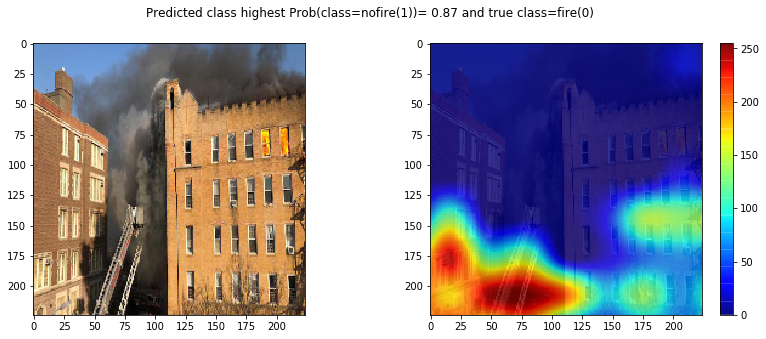

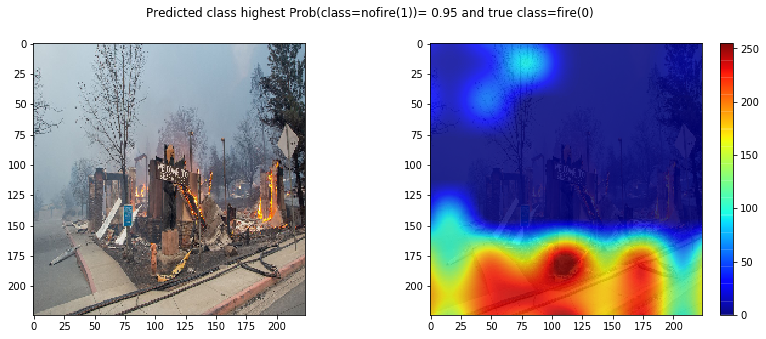

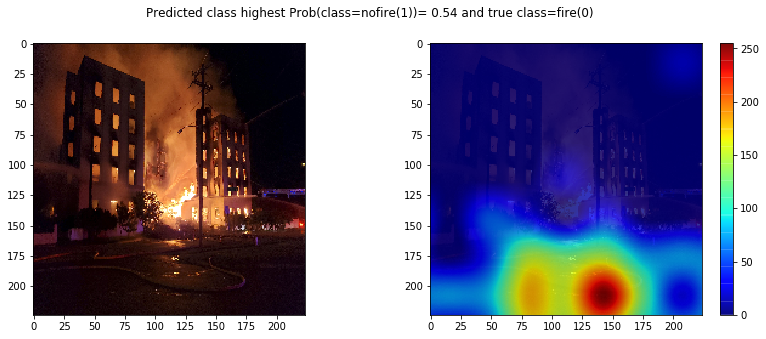

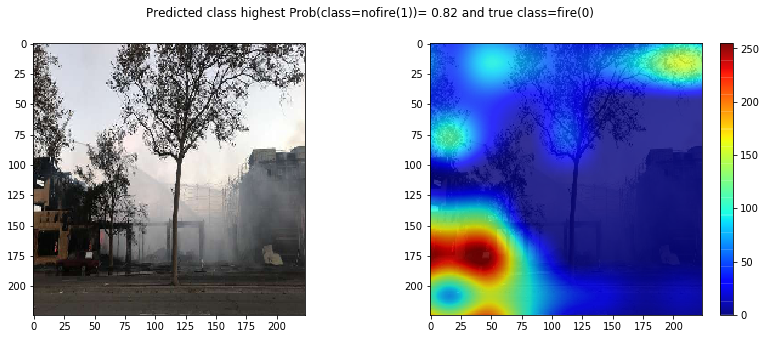

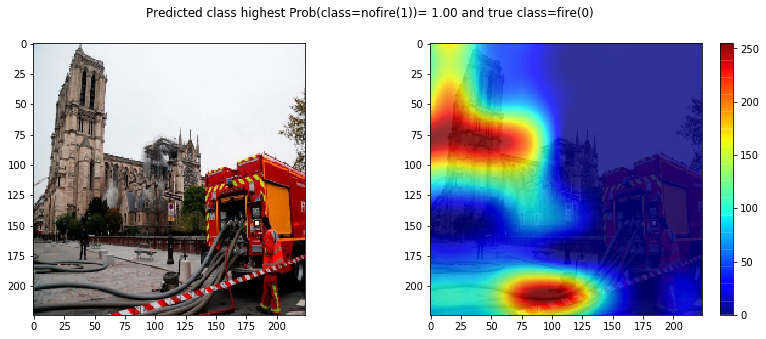

...

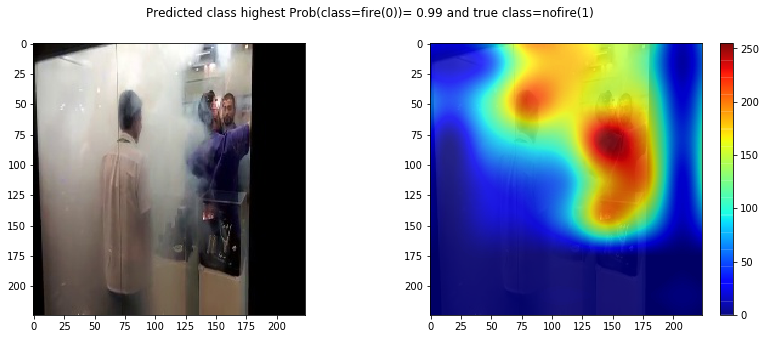

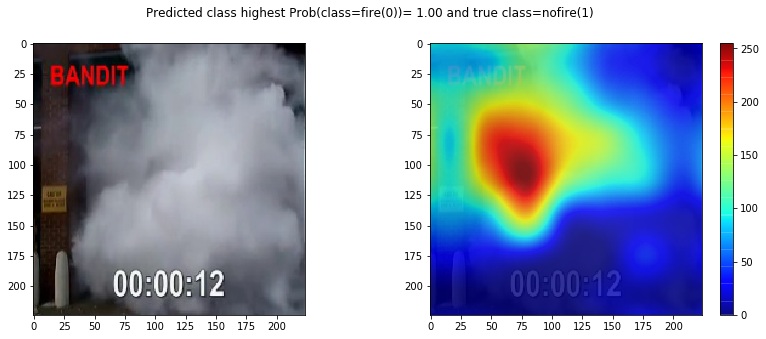

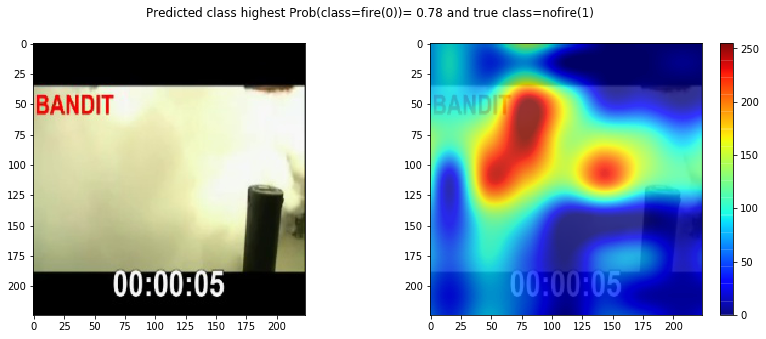

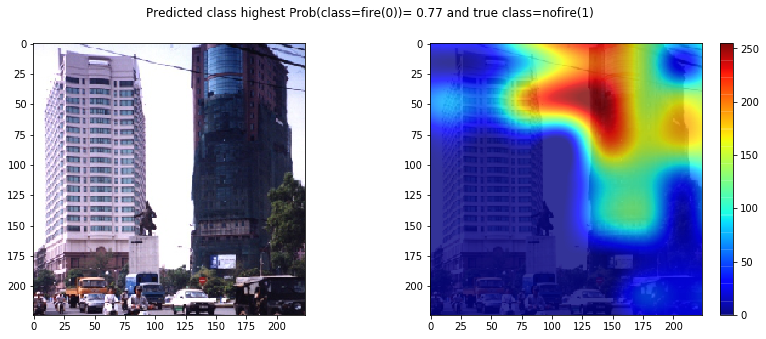

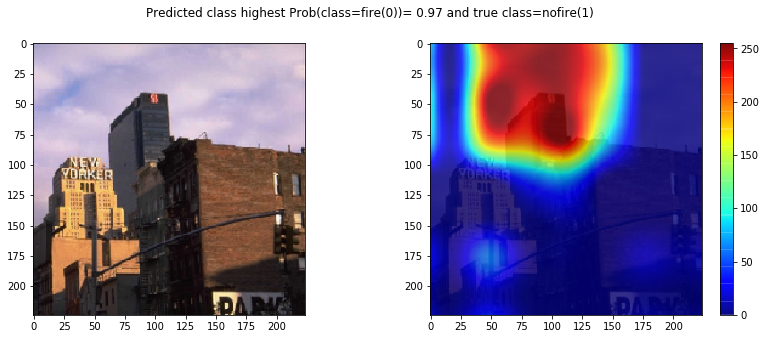

In [12]:
for item in misclassified_imgs:
    filename = item["filename"]
    true_label = item["true label"]
    pred_label = item["pred label"]
    print(f"True class: {LABELS[true_label]}({true_label}) and predicted as: {LABELS[pred_label]}({pred_label})")
    
    org_img, preprocessed_img, preds = img_predict(filename)
    grads  = visualize_cam(model, 
                           layer_idx, 
                           filter_indices=np.argmax(preds), 
                           seed_input=preprocessed_img,
                           penultimate_layer_idx = penultimate_layer_idx,
                           backprop_modifier     = None,
                           grad_modifier         = None)
    
    plot_map(grads, org_img, pred_label, true_label, preds[0, np.argmax(preds)])